The most famous space program agency in the observable universe provided you with this
dataset which contains information on Near-Earth Objects (NEOs) they have been detected by
Near-Earth Object Wide-field Infrared Survey Explorer (NEOWISE) mission. Your task is to
analyze the dataset to gain insights into the characteristics of asteroids that could potentially
impact Earth and to analyze this data and identify patterns and trends that can inform
recommendations for monitoring and preventing potentially hazardous asteroid impacts

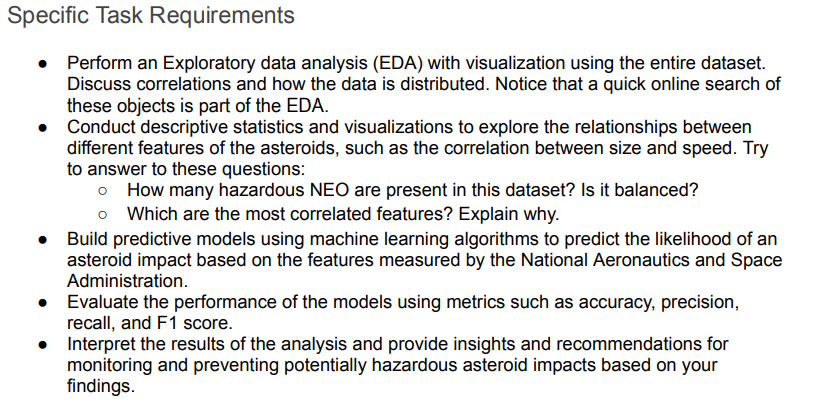

In [1]:
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

sns.set()
plt.style.use("fivethirtyeight")

In [2]:
import os
os.chdir(r"C:\Università\Luiss\2nd semester\Machine Learning\Lab\Project\Asteroids classification - dataset")

asteroid_df = pd.read_csv("asteroid_dataset.csv")

In [3]:
len(asteroid_df.columns)

40

In [4]:
pd.set_option('display.max_columns', 40)

In [5]:
asteroid_df.head()

,Neo Reference ID,Name,Absolute Magnitude,Est Dia in KM(min),Est Dia in KM(max),Est Dia in M(min),Est Dia in M(max),Est Dia in Miles(min),Est Dia in Miles(max),Est Dia in Feet(min),Est Dia in Feet(max),Close Approach Date,Epoch Date Close Approach,Relative Velocity km per sec,Relative Velocity km per hr,Miles per hour,Miss Dist.(Astronomical),Miss Dist.(lunar),Miss Dist.(kilometers),Miss Dist.(miles),Orbiting Body,Orbit ID,Orbit Determination Date,Orbit Uncertainity,Minimum Orbit Intersection,Jupiter Tisserand Invariant,Epoch Osculation,Eccentricity,Semi Major Axis,Inclination,Asc Node Longitude,Orbital Period,Perihelion Distance,Perihelion Arg,Aphelion Dist,Perihelion Time,Mean Anomaly,Mean Motion,Equinox,Hazardous
0,3703080,3703080,21.6,0.127220,0.284472,127.219879,284.472297,0.079051,0.176763,417.388066,933.308089,1995-01-01,788947200000,6.115834,22017.003799,13680.509944,0.419483,163.178711,62753692.0,38993336.0,Earth,17,2017-04-06 08:36:37,5,0.025282,4.634,2458000.5,0.425549,1.407011,6.025981,314.373913,609.599786,0.808259,57.257470,2.005764,2.458162e+06,264.837533,0.590551,J2000,True
1,3723955,3723955,21.3,0.146068,0.326618,146.067964,326.617897,0.090762,0.202951,479.225620,1071.581063,1995-01-01,788947200000,18.113985,65210.346095,40519.173105,0.383014,148.992630,57298148.0,35603420.0,Earth,21,2017-04-06 08:32:49,3,0.186935,5.457,2458000.5,0.351674,1.107776,28.412996,136.717242,425.869294,0.718200,313.091975,1.497352,2.457795e+06,173.741112,0.845330,J2000,False
2,2446862,2446862,20.3,0.231502,0.517654,231.502122,517.654482,0.143849,0.321655,759.521423,1698.341531,1995-01-08,789552000000,7.590711,27326.560182,16979.661798,0.050956,19.821890,7622911.5,4736657.5,Earth,22,2017-04-06 09:20:19,0,0.043058,4.557,2458000.5,0.348248,1.458824,4.237961,259.475979,643.580228,0.950791,248.415038,1.966857,2.458120e+06,292.893654,0.559371,J2000,True
3,3092506,3092506,27.4,0.008801,0.019681,8.801465,19.680675,0.005469,0.012229,28.876199,64.569144,1995-01-15,790156800000,11.173874,40225.948191,24994.839864,0.285322,110.990387,42683616.0,26522368.0,Earth,7,2017-04-06 09:15:49,6,0.005512,5.093,2458000.5,0.216578,1.255903,7.905894,57.173266,514.082140,0.983902,18.707701,1.527904,2.457902e+06,68.741007,0.700277,J2000,False
4,3514799,3514799,21.6,0.127220,0.284472,127.219879,284.472297,0.079051,0.176763,417.388066,933.308089,1995-01-15,790156800000,9.840831,35426.991794,22012.954985,0.407832,158.646713,61010824.0,37910368.0,Earth,25,2017-04-06 08:57:58,1,0.034798,5.154,2458000.5,0.210448,1.225615,16.793382,84.629307,495.597821,0.967687,158.263596,1.483543,2.457814e+06,135.142133,0.726395,J2000,True


In [6]:
# Adjusting these two data types: ('Close Approach Date', 'Orbit Determination Date')
asteroid_df["Close Approach Date"] = pd.to_datetime(asteroid_df["Close Approach Date"], format = "%Y/%m/%d")
asteroid_df["Orbit Determination Date"] = pd.to_datetime(asteroid_df["Orbit Determination Date"], format = "%Y%m%d %H:%M:%S")

<AxesSubplot: xlabel='Close Approach Date', ylabel='Count'>

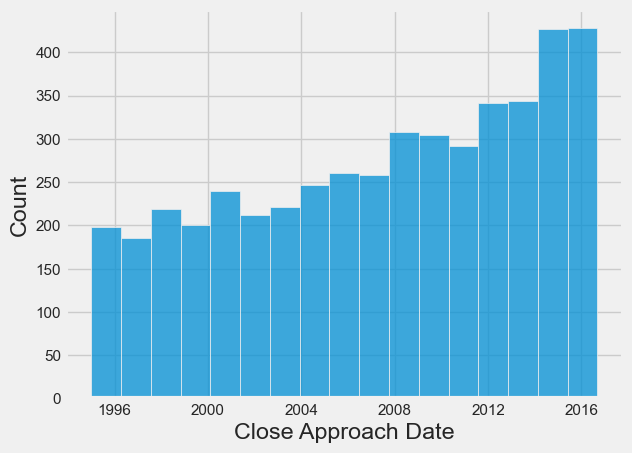

In [7]:
# Checking the distribution of the date expressed in this format, since we will leave just the 'epoch' format (which is an integer)
sns.histplot(asteroid_df["Close Approach Date"])

### Data Cleaning

In [9]:
# Deleting redoundant cells
asteroid_df2 = asteroid_df.drop(columns =
    ["Est Dia in KM(min)", "Est Dia in KM(max)", "Est Dia in Miles(min)",
     "Est Dia in Miles(max)", "Est Dia in Feet(min)", "Est Dia in Feet(max)",
     "Close Approach Date", "Relative Velocity km per hr", "Miles per hour",
     "Miss Dist.(Astronomical)", "Miss Dist.(lunar)", "Miss Dist.(miles)"]).copy()

In [10]:
# Checking if these two columns just have a single value
print(asteroid_df2["Orbiting Body"].value_counts(), "\n")
print(asteroid_df2.Equinox.value_counts())

Earth    4687
Name: Orbiting Body, dtype: int64 

J2000    4687
Name: Equinox, dtype: int64


In [11]:
# 'Neo Reference ID' and 'Name' seems to be the same, let's check
asteroid_df2["Neo Reference ID"].equals(asteroid_df2["Name"])

True

In [12]:
asteroid_df2 = asteroid_df2.drop(columns = ["Orbiting Body", "Equinox", "Name"])

In [13]:
# Up to now, we have restrict the analysis to 25 features
len(asteroid_df2.columns)

25

In [14]:
asteroid_df2.head()

,Neo Reference ID,Absolute Magnitude,Est Dia in M(min),Est Dia in M(max),Epoch Date Close Approach,Relative Velocity km per sec,Miss Dist.(kilometers),Orbit ID,Orbit Determination Date,Orbit Uncertainity,Minimum Orbit Intersection,Jupiter Tisserand Invariant,Epoch Osculation,Eccentricity,Semi Major Axis,Inclination,Asc Node Longitude,Orbital Period,Perihelion Distance,Perihelion Arg,Aphelion Dist,Perihelion Time,Mean Anomaly,Mean Motion,Hazardous
0,3703080,21.6,127.219879,284.472297,788947200000,6.115834,62753692.0,17,2017-04-06 08:36:37,5,0.025282,4.634,2458000.5,0.425549,1.407011,6.025981,314.373913,609.599786,0.808259,57.257470,2.005764,2.458162e+06,264.837533,0.590551,True
1,3723955,21.3,146.067964,326.617897,788947200000,18.113985,57298148.0,21,2017-04-06 08:32:49,3,0.186935,5.457,2458000.5,0.351674,1.107776,28.412996,136.717242,425.869294,0.718200,313.091975,1.497352,2.457795e+06,173.741112,0.845330,False
2,2446862,20.3,231.502122,517.654482,789552000000,7.590711,7622911.5,22,2017-04-06 09:20:19,0,0.043058,4.557,2458000.5,0.348248,1.458824,4.237961,259.475979,643.580228,0.950791,248.415038,1.966857,2.458120e+06,292.893654,0.559371,True
3,3092506,27.4,8.801465,19.680675,790156800000,11.173874,42683616.0,7,2017-04-06 09:15:49,6,0.005512,5.093,2458000.5,0.216578,1.255903,7.905894,57.173266,514.082140,0.983902,18.707701,1.527904,2.457902e+06,68.741007,0.700277,False
4,3514799,21.6,127.219879,284.472297,790156800000,9.840831,61010824.0,25,2017-04-06 08:57:58,1,0.034798,5.154,2458000.5,0.210448,1.225615,16.793382,84.629307,495.597821,0.967687,158.263596,1.483543,2.457814e+06,135.142133,0.726395,True


In [15]:
# Checking data types
asteroid_df2.dtypes

Neo Reference ID                         int64
Absolute Magnitude                     float64
Est Dia in M(min)                      float64
Est Dia in M(max)                      float64
Epoch Date Close Approach                int64
Relative Velocity km per sec           float64
Miss Dist.(kilometers)                 float64
Orbit ID                                 int64
Orbit Determination Date        datetime64[ns]
Orbit Uncertainity                       int64
Minimum Orbit Intersection             float64
Jupiter Tisserand Invariant            float64
Epoch Osculation                       float64
Eccentricity                           float64
Semi Major Axis                        float64
Inclination                            float64
Asc Node Longitude                     float64
Orbital Period                         float64
Perihelion Distance                    float64
Perihelion Arg                         float64
Aphelion Dist                          float64
Perihelion Ti

In [16]:
# Checking for missing values
asteroid_df2.isnull().sum()

Neo Reference ID                0
Absolute Magnitude              0
Est Dia in M(min)               0
Est Dia in M(max)               0
Epoch Date Close Approach       0
Relative Velocity km per sec    0
Miss Dist.(kilometers)          0
Orbit ID                        0
Orbit Determination Date        0
Orbit Uncertainity              0
Minimum Orbit Intersection      0
Jupiter Tisserand Invariant     0
Epoch Osculation                0
Eccentricity                    0
Semi Major Axis                 0
Inclination                     0
Asc Node Longitude              0
Orbital Period                  0
Perihelion Distance             0
Perihelion Arg                  0
Aphelion Dist                   0
Perihelion Time                 0
Mean Anomaly                    0
Mean Motion                     0
Hazardous                       0
dtype: int64

In [17]:
# Checking for duplicates
asteroid_df2.duplicated().sum()

0

In [18]:
# If we lauch the 'df.duplicated()' method, we have zero duplicated rows.
# However, if we check the 'Neo Reference ID', a unique code to identify the
# Neo, it turns out there are actually 751 instances with the same ID
value_count = asteroid_df2["Neo Reference ID"].value_counts()
value_count2 = value_count[value_count > 1]
print(value_count2[:4], "\n")
print("The lenght is:", len(value_count2))

3748472    7
3102762    7
2277810    6
3772993    6
Name: Neo Reference ID, dtype: int64 

The lenght is: 751


In [19]:
# Lets' take the first ID of that Series as example, just to understand what makes these rows different 
duplicate = asteroid_df2[asteroid_df2["Neo Reference ID"] == 3748472]
duplicate

,Neo Reference ID,Absolute Magnitude,Est Dia in M(min),Est Dia in M(max),Epoch Date Close Approach,Relative Velocity km per sec,Miss Dist.(kilometers),Orbit ID,Orbit Determination Date,Orbit Uncertainity,Minimum Orbit Intersection,Jupiter Tisserand Invariant,Epoch Osculation,Eccentricity,Semi Major Axis,Inclination,Asc Node Longitude,Orbital Period,Perihelion Distance,Perihelion Arg,Aphelion Dist,Perihelion Time,Mean Anomaly,Mean Motion,Hazardous
239,3748472,26.9,11.080388,24.776501,839487600000,9.994684,27843766.0,4,2017-04-06 08:27:11,7,0.033695,6.057,2458000.5,0.165903,1.002189,2.079748,227.003992,366.457019,0.835923,194.910729,1.168456,2.458098e+06,264.438256,0.98238,False
728,3748472,26.9,11.080388,24.776501,934700400000,5.669503,7658459.0,4,2017-04-06 08:27:11,7,0.033695,6.057,2458000.5,0.165903,1.002189,2.079748,227.003992,366.457019,0.835923,194.910729,1.168456,2.458098e+06,264.438256,0.98238,False
910,3748472,26.9,11.080388,24.776501,966322800000,4.740046,5449969.0,4,2017-04-06 08:27:11,7,0.033695,6.057,2458000.5,0.165903,1.002189,2.079748,227.003992,366.457019,0.835923,194.910729,1.168456,2.458098e+06,264.438256,0.98238,False
1412,3748472,26.9,11.080388,24.776501,1060326000000,2.608256,12762400.0,4,2017-04-06 08:27:11,7,0.033695,6.057,2458000.5,0.165903,1.002189,2.079748,227.003992,366.457019,0.835923,194.910729,1.168456,2.458098e+06,264.438256,0.98238,False
1980,3748472,26.9,11.080388,24.776501,1150959600000,3.964090,21285950.0,4,2017-04-06 08:27:11,7,0.033695,6.057,2458000.5,0.165903,1.002189,2.079748,227.003992,366.457019,0.835923,194.910729,1.168456,2.458098e+06,264.438256,0.98238,False
2631,3748472,26.9,11.080388,24.776501,1242975600000,4.405122,23804992.0,4,2017-04-06 08:27:11,7,0.033695,6.057,2458000.5,0.165903,1.002189,2.079748,227.003992,366.457019,0.835923,194.910729,1.168456,2.458098e+06,264.438256,0.98238,False
3343,3748472,26.9,11.080388,24.776501,1335078000000,4.076891,21236662.0,4,2017-04-06 08:27:11,7,0.033695,6.057,2458000.5,0.165903,1.002189,2.079748,227.003992,366.457019,0.835923,194.910729,1.168456,2.458098e+06,264.438256,0.98238,False


In [20]:
# It's basically an update in terms of epoch date close approach, relative velocity, diameter, etc.
# Since we collected this information, we could choose to keep just the last observation.
asteroid_df3 = asteroid_df2.copy()
asteroid_df3 = asteroid_df3.drop_duplicates(subset = "Neo Reference ID", keep = "last", ignore_index = True)

In [21]:
# Adjusting data type: ('Hazardous')
asteroid_df3["Hazardous"] = asteroid_df3["Hazardous"].map({True: 1, False: 0}, na_action = "ignore")

In [22]:
asteroid_df3.head(3)

,Neo Reference ID,Absolute Magnitude,Est Dia in M(min),Est Dia in M(max),Epoch Date Close Approach,Relative Velocity km per sec,Miss Dist.(kilometers),Orbit ID,Orbit Determination Date,Orbit Uncertainity,Minimum Orbit Intersection,Jupiter Tisserand Invariant,Epoch Osculation,Eccentricity,Semi Major Axis,Inclination,Asc Node Longitude,Orbital Period,Perihelion Distance,Perihelion Arg,Aphelion Dist,Perihelion Time,Mean Anomaly,Mean Motion,Hazardous
0,3703080,21.6,127.219879,284.472297,788947200000,6.115834,62753692.0,17,2017-04-06 08:36:37,5,0.025282,4.634,2458000.5,0.425549,1.407011,6.025981,314.373913,609.599786,0.808259,57.257470,2.005764,2.458162e+06,264.837533,0.590551,1
1,2446862,20.3,231.502122,517.654482,789552000000,7.590711,7622911.5,22,2017-04-06 09:20:19,0,0.043058,4.557,2458000.5,0.348248,1.458824,4.237961,259.475979,643.580228,0.950791,248.415038,1.966857,2.458120e+06,292.893654,0.559371,1
2,3092506,27.4,8.801465,19.680675,790156800000,11.173874,42683616.0,7,2017-04-06 09:15:49,6,0.005512,5.093,2458000.5,0.216578,1.255903,7.905894,57.173266,514.082140,0.983902,18.707701,1.527904,2.457902e+06,68.741007,0.700277,0


In [23]:
asteroid_df3.dtypes

Neo Reference ID                         int64
Absolute Magnitude                     float64
Est Dia in M(min)                      float64
Est Dia in M(max)                      float64
Epoch Date Close Approach                int64
Relative Velocity km per sec           float64
Miss Dist.(kilometers)                 float64
Orbit ID                                 int64
Orbit Determination Date        datetime64[ns]
Orbit Uncertainity                       int64
Minimum Orbit Intersection             float64
Jupiter Tisserand Invariant            float64
Epoch Osculation                       float64
Eccentricity                           float64
Semi Major Axis                        float64
Inclination                            float64
Asc Node Longitude                     float64
Orbital Period                         float64
Perihelion Distance                    float64
Perihelion Arg                         float64
Aphelion Dist                          float64
Perihelion Ti

### Exploratory Data Analysis:

In [24]:
# Visualizing the main statistics of the numerical variables
asteroid_df3.describe()

,Neo Reference ID,Absolute Magnitude,Est Dia in M(min),Est Dia in M(max),Epoch Date Close Approach,Relative Velocity km per sec,Miss Dist.(kilometers),Orbit ID,Orbit Uncertainity,Minimum Orbit Intersection,Jupiter Tisserand Invariant,Epoch Osculation,Eccentricity,Semi Major Axis,Inclination,Asc Node Longitude,Orbital Period,Perihelion Distance,Perihelion Arg,Aphelion Dist,Perihelion Time,Mean Anomaly,Mean Motion,Hazardous
count,3.692000e+03,3692.000000,3692.000000,3692.000000,3.692000e+03,3692.000000,3.692000e+03,3692.000000,3692.000000,3692.000000,3692.000000,3.692000e+03,3692.000000,3692.000000,3692.000000,3692.000000,3692.000000,3692.000000,3692.000000,3692.000000,3.692000e+03,3692.000000,3692.000000,3692.000000
mean,3.290969e+06,22.234521,208.634410,466.520722,1.212731e+12,13.939539,3.753914e+07,27.633532,3.696912,0.085912,4.865927,2.457689e+06,0.394591,1.474761,13.321493,173.274901,685.776363,0.836811,183.867618,2.112712,2.457692e+06,179.377556,0.685597,0.156013
std,5.387741e+05,2.889463,391.979849,876.493587,1.915131e+11,7.480592,2.209257e+07,38.346928,3.129025,0.092168,1.214961,9.786526e+02,0.182571,0.539212,11.031926,103.180309,385.814939,0.242802,103.295853,0.987983,1.003917e+03,109.027035,0.332920,0.362917
min,2.000433e+06,11.160000,1.010543,2.259644,7.889472e+11,0.335504,2.660989e+04,1.000000,0.000000,0.000002,2.196000,2.450164e+06,0.007522,0.615920,0.014513,0.001941,176.557161,0.080744,0.006918,0.803765,2.450100e+06,0.003191,0.086285,0.000000
25%,3.127402e+06,20.100000,33.462237,74.823838,1.068883e+12,8.163139,1.803732e+07,9.000000,0.000000,0.015600,3.845000,2.458000e+06,0.249785,1.050625,4.976819,84.599868,393.341573,0.663503,95.365365,1.323462,2.457782e+06,82.398595,0.402890,0.000000
50%,3.529614e+06,21.900000,110.803882,247.765013,1.250017e+12,12.847385,3.863978e+07,16.000000,4.000000,0.050468,4.825500,2.458000e+06,0.384478,1.325252,10.063007,173.752674,557.245182,0.864658,188.816524,1.779584,2.457963e+06,182.584214,0.646035,0.000000
75%,3.694459e+06,24.500000,253.837029,567.596853,1.381820e+12,18.126272,5.696368e+07,30.000000,7.000000,0.132253,5.778250,2.458000e+06,0.526459,1.815564,19.230701,256.892951,893.543558,1.017402,271.429458,2.688758,2.458113e+06,276.455876,0.915235,0.000000
max,3.781897e+06,32.100000,15579.552413,34836.938254,1.473318e+12,44.633747,7.478160e+07,611.000000,9.000000,0.477891,9.025000,2.458020e+06,0.960261,5.072008,75.406667,359.905890,4172.231343,1.299832,359.993098,8.983852,2.458839e+06,359.917991,2.039000,1.000000


In [25]:
asteroid_df3.filter(["Absolute Magnitude", "Est Dia in M(min)", "Est Dia in M(max)",
                  "Relative Velocity km per sec", "Miss Dist.(kilometers)",
                 "Eccentricity", "Inclination", "Mean Motion"]).describe()

,Absolute Magnitude,Est Dia in M(min),Est Dia in M(max),Relative Velocity km per sec,Miss Dist.(kilometers),Eccentricity,Inclination,Mean Motion
count,3692.000000,3692.000000,3692.000000,3692.000000,3.692000e+03,3692.000000,3692.000000,3692.000000
mean,22.234521,208.634410,466.520722,13.939539,3.753914e+07,0.394591,13.321493,0.685597
std,2.889463,391.979849,876.493587,7.480592,2.209257e+07,0.182571,11.031926,0.332920
min,11.160000,1.010543,2.259644,0.335504,2.660989e+04,0.007522,0.014513,0.086285
25%,20.100000,33.462237,74.823838,8.163139,1.803732e+07,0.249785,4.976819,0.402890
50%,21.900000,110.803882,247.765013,12.847385,3.863978e+07,0.384478,10.063007,0.646035
75%,24.500000,253.837029,567.596853,18.126272,5.696368e+07,0.526459,19.230701,0.915235
max,32.100000,15579.552413,34836.938254,44.633747,7.478160e+07,0.960261,75.406667,2.039000


array([[<AxesSubplot: title={'center': 'Neo Reference ID'}>,
        <AxesSubplot: title={'center': 'Absolute Magnitude'}>,
        <AxesSubplot: title={'center': 'Est Dia in M(min)'}>,
        <AxesSubplot: title={'center': 'Est Dia in M(max)'}>,
        <AxesSubplot: title={'center': 'Epoch Date Close Approach'}>],
       [<AxesSubplot: title={'center': 'Relative Velocity km per sec'}>,
        <AxesSubplot: title={'center': 'Miss Dist.(kilometers)'}>,
        <AxesSubplot: title={'center': 'Orbit ID'}>,
        <AxesSubplot: title={'center': 'Orbit Determination Date'}>,
        <AxesSubplot: title={'center': 'Orbit Uncertainity'}>],
       [<AxesSubplot: title={'center': 'Minimum Orbit Intersection'}>,
        <AxesSubplot: title={'center': 'Jupiter Tisserand Invariant'}>,
        <AxesSubplot: title={'center': 'Epoch Osculation'}>,
        <AxesSubplot: title={'center': 'Eccentricity'}>,
        <AxesSubplot: title={'center': 'Semi Major Axis'}>],
       [<AxesSubplot: title={'cen

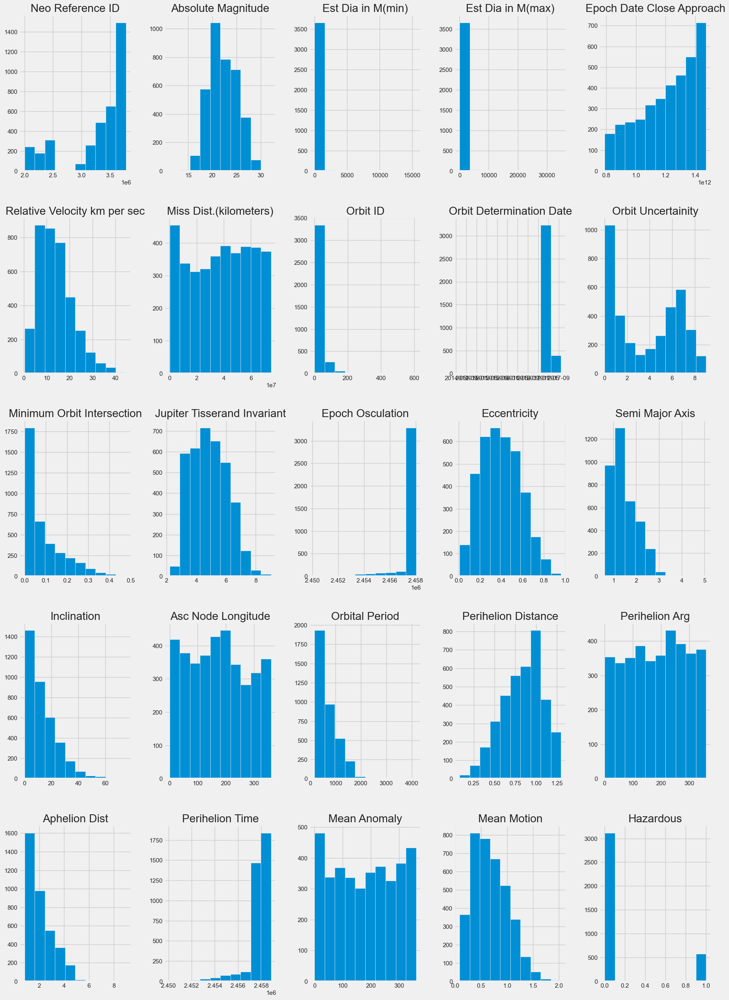

In [26]:
# Plotting the distribution
asteroid_df3.hist(figsize=(20, 30))

array([[<AxesSubplot: title={'center': 'Hazardous'}>,
        <AxesSubplot: title={'center': 'Perihelion Time'}>],
       [<AxesSubplot: title={'center': 'Orbit Uncertainity'}>,
        <AxesSubplot: title={'center': 'Relative Velocity km per sec'}>]],
      dtype=object)

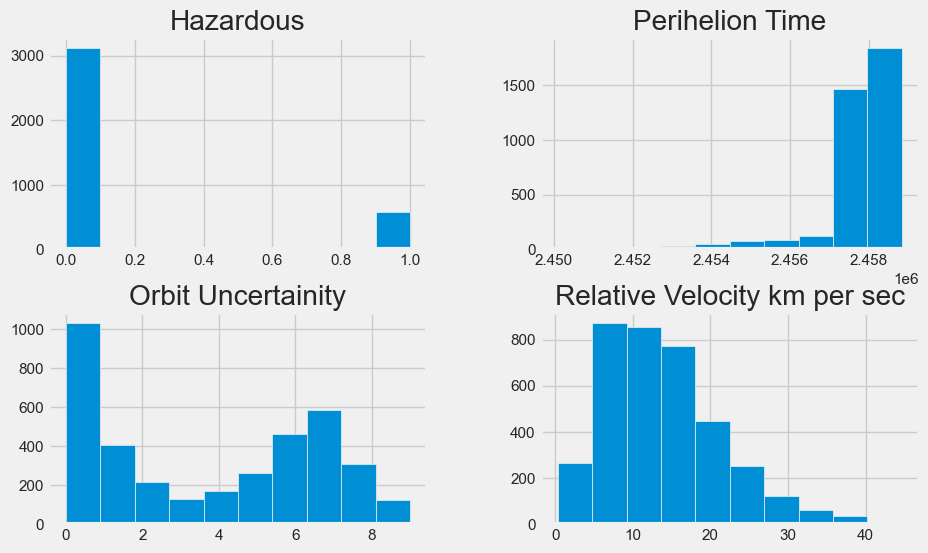

In [27]:
# Plotting some 'key' features
asteroid_df3.filter(["Hazardous", "Perihelion Time", "Orbit Uncertainity", "Relative Velocity km per sec"]).hist(figsize=(10, 6))

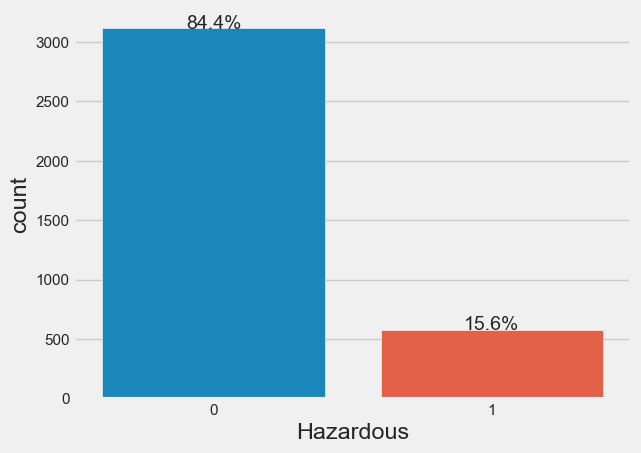

In [28]:
# How much our target variable is unbalanced?
counts_2 = asteroid_df3["Hazardous"].value_counts()
percentages_2 = counts_2 / len(asteroid_df3) * 100

ax = sns.countplot(data = asteroid_df3, x = "Hazardous")

patches = ax.patches
for i in range(len(patches)):
   x = patches[i].get_x() + patches[i].get_width()/2
   y = patches[i].get_height()+.05
   ax.annotate('{:.1f}%'.format(percentages_2[i]), (x, y), ha='center')


In [29]:
# Showing absolute values
asteroid_df3["Hazardous"].value_counts()

0    3116
1     576
Name: Hazardous, dtype: int64

### Splitting in training, validation and test set

Since we want to avoid the *snooping bias*, we split the data after a very quick look at the data

In [30]:
asteroid_df3.head(1)

,Neo Reference ID,Absolute Magnitude,Est Dia in M(min),Est Dia in M(max),Epoch Date Close Approach,Relative Velocity km per sec,Miss Dist.(kilometers),Orbit ID,Orbit Determination Date,Orbit Uncertainity,Minimum Orbit Intersection,Jupiter Tisserand Invariant,Epoch Osculation,Eccentricity,Semi Major Axis,Inclination,Asc Node Longitude,Orbital Period,Perihelion Distance,Perihelion Arg,Aphelion Dist,Perihelion Time,Mean Anomaly,Mean Motion,Hazardous
0,3703080,21.6,127.219879,284.472297,788947200000,6.115834,62753692.0,17,2017-04-06 08:36:37,5,0.025282,4.634,2458000.5,0.425549,1.407011,6.025981,314.373913,609.599786,0.808259,57.25747,2.005764,2.458162e+06,264.837533,0.590551,1


In [89]:
from sklearn.model_selection import train_test_split

# For the X variable (input features) we get rid of the y variable (output feature) and other features by logic
# (for instance, the dates can be calculated from the other features like velocity and distance).
X = asteroid_df3.drop(columns = ["Hazardous", "Orbit Determination Date", "Orbit ID", "Neo Reference ID"])
y = asteroid_df3["Hazardous"]

# Since our output is unbalanced, we select the stratify option 
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 42, stratify = y)

# Split the training set into training and validation sets
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size = 0.2, random_state = 42)

In [90]:
# Testing the stratification
(y_train.value_counts())/len(y_train)

0    0.843776
1    0.156224
Name: Hazardous, dtype: float64

In [91]:
# Up to now, we restricted our analysis to 21 + 1 (target) hyperparameters
len(X.columns)

21

In [92]:
X_train.head(3)

,Absolute Magnitude,Est Dia in M(min),Est Dia in M(max),Epoch Date Close Approach,Relative Velocity km per sec,Miss Dist.(kilometers),Orbit Uncertainity,Minimum Orbit Intersection,Jupiter Tisserand Invariant,Epoch Osculation,Eccentricity,Semi Major Axis,Inclination,Asc Node Longitude,Orbital Period,Perihelion Distance,Perihelion Arg,Aphelion Dist,Perihelion Time,Mean Anomaly,Mean Motion
1843,21.5,133.215567,297.879063,1249714800000,10.890967,5920887.00,4,0.005570,3.274,2458000.5,0.598938,2.352439,9.373661,126.904613,1317.880209,0.943473,218.041005,3.761404,2.457718e+06,77.271387,0.273166
646,17.1,1010.543415,2259.643771,995785200000,17.968343,44262780.00,0,0.131597,5.253,2458000.5,0.358877,1.190023,9.583608,355.942326,474.167235,0.762952,202.370239,1.617095,2.458216e+06,196.538583,0.759226
677,25.1,25.383703,56.759685,1005206400000,8.326193,2228186.75,9,0.014091,3.253,2452226.5,0.586212,2.415244,5.851546,231.745769,1371.007543,0.999400,168.605510,3.831087,2.452217e+06,2.449604,0.262581


Now we can continue to explore our dataset: (only using the *training set*). The next step is checking linear correlations (and we will do it through the Pearson's correlation coefficient)

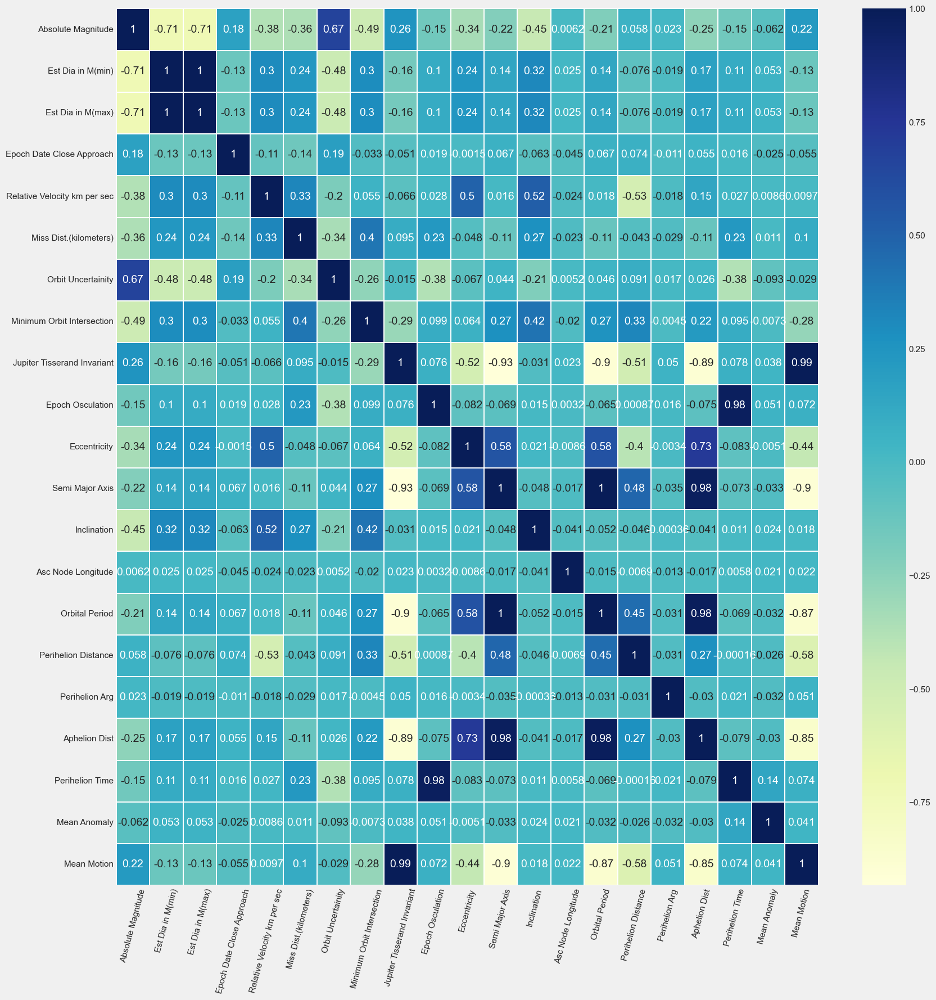

In [93]:
corr_matrix = X_train.corr(numeric_only = True)

plt.figure(figsize=(18, 18))
sns.heatmap(corr_matrix, annot = True, linewidths = 0.1, cmap = "YlGnBu")

plt.xticks(rotation = 75)

plt.tight_layout()
plt.show()

In [36]:
X_train.head(1)

,Absolute Magnitude,Est Dia in M(min),Est Dia in M(max),Epoch Date Close Approach,Relative Velocity km per sec,Miss Dist.(kilometers),Orbit Uncertainity,Minimum Orbit Intersection,Jupiter Tisserand Invariant,Epoch Osculation,Eccentricity,Semi Major Axis,Inclination,Asc Node Longitude,Orbital Period,Perihelion Distance,Perihelion Arg,Aphelion Dist,Perihelion Time,Mean Anomaly,Mean Motion
1843,21.5,133.215567,297.879063,1249714800000,10.890967,5920887.0,4,0.00557,3.274,2458000.5,0.598938,2.352439,9.373661,126.904613,1317.880209,0.943473,218.041005,3.761404,2.457718e+06,77.271387,0.273166


In [95]:
# Since we want to avoid Multicollinearity we get rid of those highly correlated features.
# A Pearson's coefficient >= |+- 0.7| is generally considered a good rule of thumb for starting.

# From the correlation matrix fall under this rule the following values:
# 1. mean motion - jupiter tisserand (SAME VARIABLE) => 'jupiter' deleted
# 2. perihelion time - Epoch osculation (SAME VARIABLE) => 'epoch osculation' deleted
# 3. aphelion dist - semi major axis (SAME VARIABLE) => 'semi major axis' deleted
# 4. orbital period - semi major axis (SAME VARIABLE)
# 5. aphelion dist - orbital period (SAME VARIABLE) => 'orbital period' deleted
# 6. Est Dia in M(min) - Est Dia in M(max) (SAME VARIABLE) => 'est dia in M(min)' deleted
#    (since we want to be as cautious as possible we choose to keep the bigger diameter measure)
# 7. aphelion dist - jupiter (-0.89) => already deleted
# 8. orbital period - mean motion (-0.86) => already deleted
# 9. mean motion - aphelion dist (-0.84) => 'mean motion' deleted
# 10. aphelion dist - eccentricity (0.72) => 'aphelion distance' deleted
# 11. orbital period - jupiter (-0.89) => already deleted
# 12. semi major axis - jupiter (-0.93) => already deleted
# 13. est dia in M(min) - absolute magnitude (-0.72) => 'absolute magnitude' deleted
#     (since the diameter is a more robust measure than the brightness of the NEO)
# 14. est dia in M(max) - absolute magnitude (-0.72) => already deleted
# 15. orbit uncertainity - absolute magnitude (0.68) => in this case we treat 0.68 as an exception (as if it were 0.70)
#     In any case, absolute magnitude was already deleted.

X_train = X_train.drop(columns = ["Jupiter Tisserand Invariant", "Epoch Osculation", "Semi Major Axis", "Orbital Period",
                                  "Est Dia in M(min)", "Mean Motion", "Aphelion Dist", "Absolute Magnitude"])
X_val = X_val.drop(columns = ["Jupiter Tisserand Invariant", "Epoch Osculation", "Semi Major Axis", "Orbital Period",
                                   "Est Dia in M(min)", "Mean Motion", "Aphelion Dist", "Absolute Magnitude"])
X_test = X_test.drop(columns = ["Jupiter Tisserand Invariant", "Epoch Osculation", "Semi Major Axis", "Orbital Period",
                                  "Est Dia in M(min)", "Mean Motion", "Aphelion Dist", "Absolute Magnitude"])

In [96]:
# We have further narrowed our analysis to 13 features (+1 output)
len(X_train.columns)

13

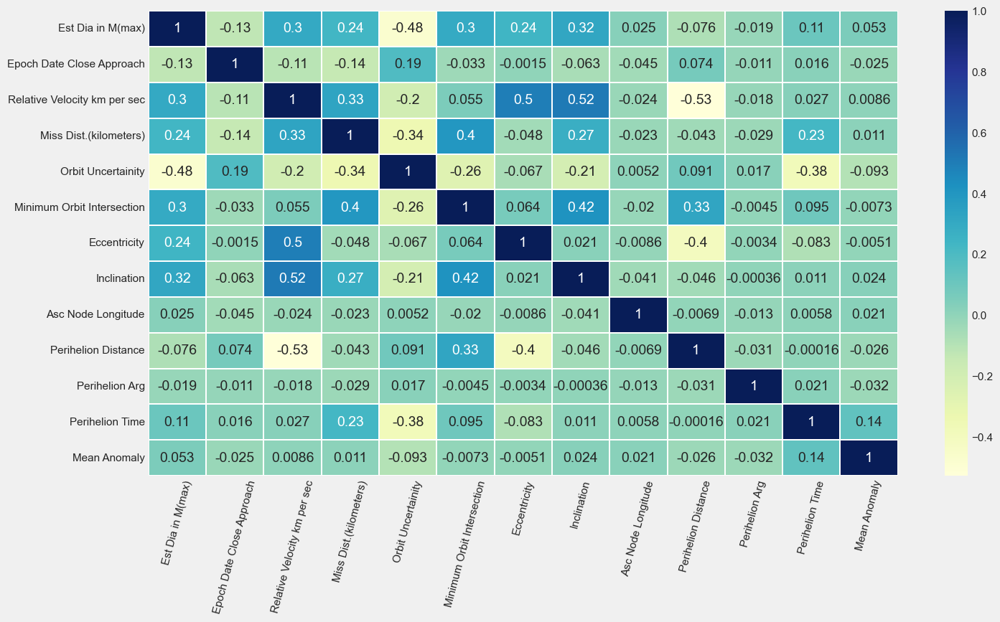

In [39]:
# Cheking again:
corr_matrix2 = X_train.corr(numeric_only = True)

plt.figure(figsize=(15, 8))
sns.heatmap(corr_matrix2, annot = True, linewidths = 0.1, cmap = "YlGnBu")

plt.xticks(rotation = 75)

plt.tight_layout()

plt.show()

**Some remarks regarding multicollinearity: (Pearson's coefficient > 0.30  -  13 features pairs)**

1. Perihelion distance - relative velocity (-0.53)
2. Inclination - relative velocity (0.51)
3. Eccentricy - relative velocity (0.49)
4. orbit uncertainity - est dia in M(max) (-0.49)
5. Inclination - minimum orbit intersection (0.42)
6. Minimum orbit - miss dist (kilometers) (0.38)
7. perihelion time - orbit uncertainity (-0.38)
8. orbit uncertainity - miss dist (kilometers) (-0.35)
9. miss dist (kilometers) - relative velocity (0.34)
10. inclination - est dia in M(max) (0.33)
11. Perihelion distance - minimum orbit (0.32)
12. minimum orbit - est dia in M(max) (0.31)
13. relative velocity - est dia in M(max) (0.31)
 

In [40]:
# Since we do not have a strong domain knowledge we decide to try different combination of parameters
X_train2 = X_train.copy()
X_val2 = X_val.copy()
X_test2 = X_test.copy()

# For this test, we dropped the four more correlated features
X_train2 = X_train2.drop(columns = ["Perihelion Distance", "Inclination", "Eccentricity", "Orbit Uncertainity"])
X_val2 = X_val2.drop(columns = ["Perihelion Distance", "Inclination", "Eccentricity", "Orbit Uncertainity"])
X_test2 = X_test2.drop(columns = ["Perihelion Distance", "Inclination", "Eccentricity", "Orbit Uncertainity"])

# Note: we will use this datasets later.

In [41]:
X_train.head(1)

,Est Dia in M(max),Epoch Date Close Approach,Relative Velocity km per sec,Miss Dist.(kilometers),Orbit Uncertainity,Minimum Orbit Intersection,Eccentricity,Inclination,Asc Node Longitude,Perihelion Distance,Perihelion Arg,Perihelion Time,Mean Anomaly
1843,297.879063,1249714800000,10.890967,5920887.0,4,0.00557,0.598938,9.373661,126.904613,0.943473,218.041005,2.457718e+06,77.271387


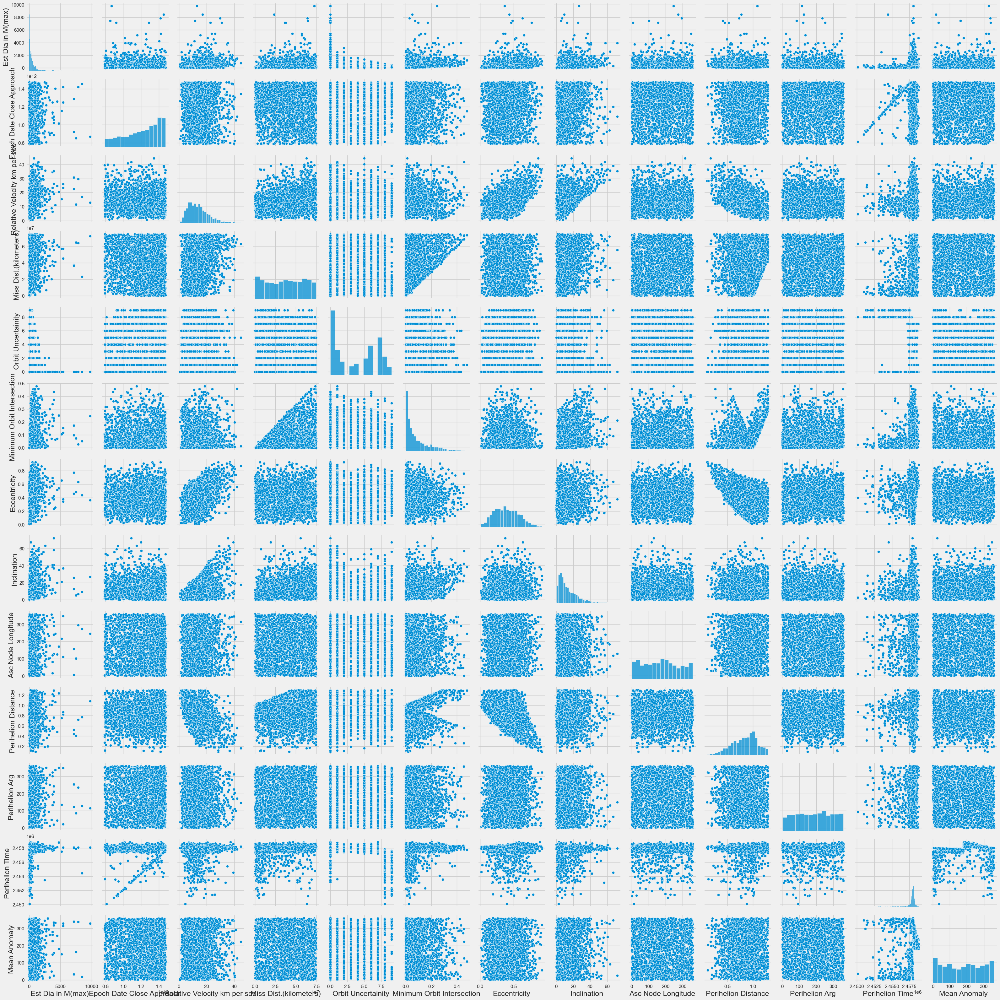

In [42]:
# Checking for non-linear relationships
sns.pairplot(X_train)

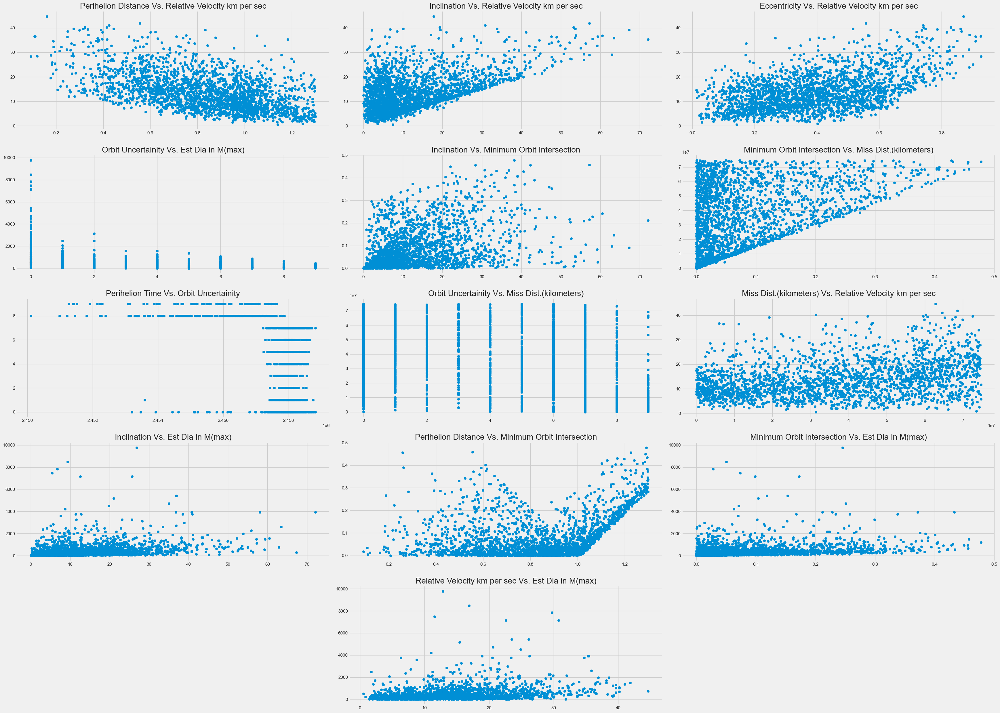

In [43]:
# Highlighting highly-correlated prameters
fig, axs = plt.subplots(nrows = 5, ncols = 3, figsize = (35, 25))


# And now, we can do something like this:
axs[0, 0].scatter(X_train['Perihelion Distance'], X_train['Relative Velocity km per sec'])
axs[0, 1].scatter(X_train['Inclination'], X_train['Relative Velocity km per sec'])
axs[0, 2].scatter(X_train['Eccentricity'], X_train['Relative Velocity km per sec'])
axs[1, 0].scatter(X_train['Orbit Uncertainity'], X_train['Est Dia in M(max)'])
axs[1, 1].scatter(X_train['Inclination'], X_train['Minimum Orbit Intersection'])
axs[1, 2].scatter(X_train['Minimum Orbit Intersection'], X_train['Miss Dist.(kilometers)'])
axs[2, 0].scatter(X_train['Perihelion Time'], X_train['Orbit Uncertainity'])
axs[2, 1].scatter(X_train['Orbit Uncertainity'], X_train['Miss Dist.(kilometers)'])
axs[2, 2].scatter(X_train['Miss Dist.(kilometers)'], X_train['Relative Velocity km per sec'])
axs[3, 0].scatter(X_train['Inclination'], X_train['Est Dia in M(max)'])
axs[3, 1].scatter(X_train['Perihelion Distance'], X_train['Minimum Orbit Intersection'])
axs[3, 2].scatter(X_train['Minimum Orbit Intersection'], X_train['Est Dia in M(max)'])
axs[4, 1].scatter(X_train['Relative Velocity km per sec'], X_train['Est Dia in M(max)'])


# Removing [4, 0] and [4, 2]
axs[4, 0].axis('off')
axs[4, 2].axis('off')


axs[0, 0].set_title("Perihelion Distance Vs. Relative Velocity km per sec")
axs[0, 1].set_title("Inclination Vs. Relative Velocity km per sec")
axs[0, 2].set_title("Eccentricity Vs. Relative Velocity km per sec")
axs[1, 0].set_title("Orbit Uncertainity Vs. Est Dia in M(max)")
axs[1, 1].set_title("Inclination Vs. Minimum Orbit Intersection")
axs[1, 2].set_title("Minimum Orbit Intersection Vs. Miss Dist.(kilometers)")
axs[2, 0].set_title("Perihelion Time Vs. Orbit Uncertainity")
axs[2, 1].set_title("Orbit Uncertainity Vs. Miss Dist.(kilometers)")
axs[2, 2].set_title("Miss Dist.(kilometers) Vs. Relative Velocity km per sec")
axs[3, 0].set_title("Inclination Vs. Est Dia in M(max)")
axs[3, 1].set_title("Perihelion Distance Vs. Minimum Orbit Intersection")
axs[3, 2].set_title("Minimum Orbit Intersection Vs. Est Dia in M(max)")
axs[4, 1].set_title("Relative Velocity km per sec Vs. Est Dia in M(max)")


# Adjust the space among subplots
fig.subplots_adjust(left=0.1, right=0.9, bottom=0.1, top=0.9, wspace=3, hspace=3)

plt.tight_layout()

#plt.savefig("Others")

plt.show()

It's important to understand that, as the eccentricity of an NEO's orbit increases, its relative velocity with respect to Earth also tends to increase. This is because eccentric orbits have a wider range of distances between the NEO and the Earth. When the NEO is at its closest approach (perigee), the gravitational pull from the Earth accelerates it, resulting in a higher relative velocity. Conversely, when the NEO is at its farthest distance (apogee), the gravitational pull from the Earth slows it down, resulting in a lower relative velocity.

<AxesSubplot: xlabel='Miss Dist.(kilometers)', ylabel='Relative Velocity km per sec'>

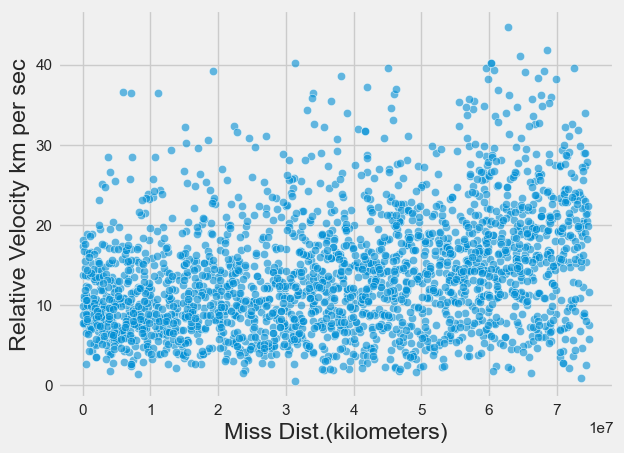

In [44]:
sns.scatterplot(data = X_train, x = "Miss Dist.(kilometers)", y = "Relative Velocity km per sec", alpha = 0.6)

In [45]:
# Printing the Pearson's coefficient
corr1 = X_train["Miss Dist.(kilometers)"].corr(X_train["Relative Velocity km per sec"])
corr2 = X_train["Eccentricity"].corr(X_train["Relative Velocity km per sec"])

print(corr1)
print(corr2)

0.3269692938472144
0.4980373471312568


In [46]:
X_train.head()

,Est Dia in M(max),Epoch Date Close Approach,Relative Velocity km per sec,Miss Dist.(kilometers),Orbit Uncertainity,Minimum Orbit Intersection,Eccentricity,Inclination,Asc Node Longitude,Perihelion Distance,Perihelion Arg,Perihelion Time,Mean Anomaly
1843,297.879063,1249714800000,10.890967,5920887.00,4,0.005570,0.598938,9.373661,126.904613,0.943473,218.041005,2.457718e+06,77.271387
646,2259.643771,995785200000,17.968343,44262780.00,0,0.131597,0.358877,9.583608,355.942326,0.762952,202.370239,2.458216e+06,196.538583
677,56.759685,1005206400000,8.326193,2228186.75,9,0.014091,0.586212,5.851546,231.745769,0.999400,168.605510,2.452217e+06,2.449604
107,1081.533507,824976000000,40.165511,60259216.00,0,0.197366,0.830217,19.310159,172.158123,0.322646,203.764902,2.457759e+06,15.446469
1370,124.176661,1164182400000,6.837099,12108657.00,7,0.079492,0.582684,5.241606,81.259834,1.059114,337.521359,2.458492e+06,240.184404


### Outliers

{'whiskers': [<matplotlib.lines.Line2D at 0x1e51843d000>,
 'caps': [<matplotlib.lines.Line2D at 0x1e51843d540>,
 'boxes': [<matplotlib.lines.Line2D at 0x1e51843cd60>],
 'medians': [<matplotlib.lines.Line2D at 0x1e51843da80>],
 'fliers': [<matplotlib.lines.Line2D at 0x1e51843dd20>],
 'means': []}

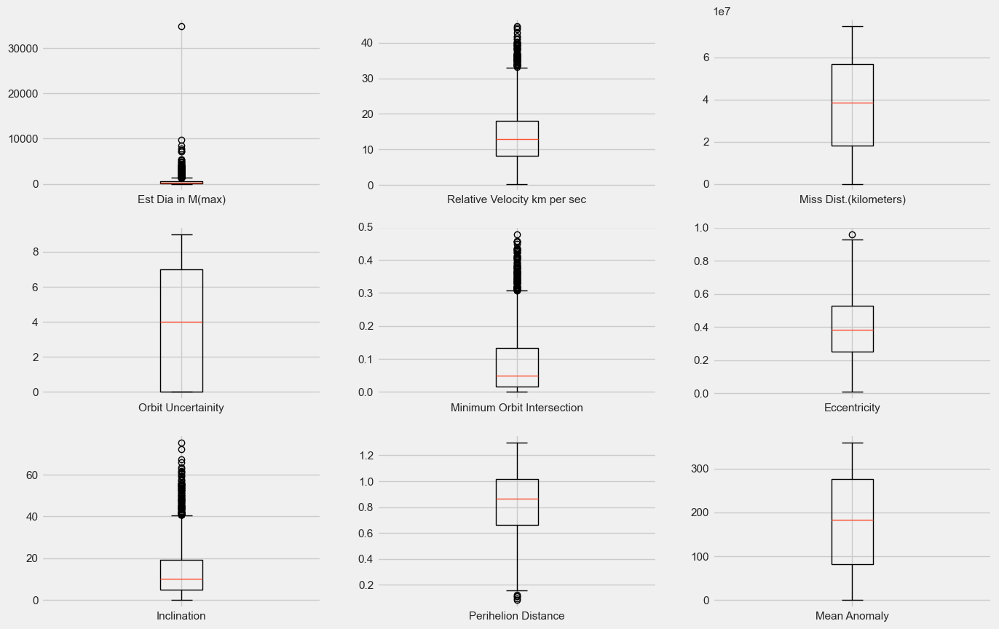

In [47]:
# Boxplots are generally considered a good vary to check outliers
fig, axs = plt.subplots(nrows = 3, ncols = 3, figsize = (15, 10))


# And now, we can do something like this:
axs[0, 0].boxplot(x = asteroid_df3['Est Dia in M(max)'], labels = ['Est Dia in M(max)'])
axs[0, 1].boxplot(x = asteroid_df3['Relative Velocity km per sec'], labels = ['Relative Velocity km per sec'])
axs[0, 2].boxplot(x = asteroid_df3['Miss Dist.(kilometers)'], labels = ['Miss Dist.(kilometers)'])
axs[1, 0].boxplot(x = asteroid_df3['Orbit Uncertainity'], labels = ['Orbit Uncertainity'])
axs[1, 1].boxplot(x = asteroid_df3['Minimum Orbit Intersection'], labels = ['Minimum Orbit Intersection'])
axs[1, 2].boxplot(x = asteroid_df3['Eccentricity'], labels = ['Eccentricity'])
axs[2, 0].boxplot(x = asteroid_df3['Inclination'], labels = ['Inclination'])
axs[2, 1].boxplot(x = asteroid_df3['Perihelion Distance'], labels = ['Perihelion Distance'])
axs[2, 2].boxplot(x = asteroid_df3['Mean Anomaly'], labels = ['Mean Anomaly'])

In [48]:
asteroid_df3.filter(["Est Dia in M(max)", "Relative Velocity km per sec", "Miss Dist.(kilometers)",
                "Orbit Uncertainity", "Minimum Orbit Intersection", "Eccentricity",
                "Inclination", "Perihelion Distance", "Mean Anomaly"]).describe()

,Est Dia in M(max),Relative Velocity km per sec,Miss Dist.(kilometers),Orbit Uncertainity,Minimum Orbit Intersection,Eccentricity,Inclination,Perihelion Distance,Mean Anomaly
count,3692.000000,3692.000000,3.692000e+03,3692.000000,3692.000000,3692.000000,3692.000000,3692.000000,3692.000000
mean,466.520722,13.939539,3.753914e+07,3.696912,0.085912,0.394591,13.321493,0.836811,179.377556
std,876.493587,7.480592,2.209257e+07,3.129025,0.092168,0.182571,11.031926,0.242802,109.027035
min,2.259644,0.335504,2.660989e+04,0.000000,0.000002,0.007522,0.014513,0.080744,0.003191
25%,74.823838,8.163139,1.803732e+07,0.000000,0.015600,0.249785,4.976819,0.663503,82.398595
50%,247.765013,12.847385,3.863978e+07,4.000000,0.050468,0.384478,10.063007,0.864658,182.584214
75%,567.596853,18.126272,5.696368e+07,7.000000,0.132253,0.526459,19.230701,1.017402,276.455876
max,34836.938254,44.633747,7.478160e+07,9.000000,0.477891,0.960261,75.406667,1.299832,359.917991


In [49]:
# Visualyzing the bigger value of 'Est Dia in M(max)'
max = asteroid_df3[asteroid_df3["Est Dia in M(max)"] > 34000]
max

,Neo Reference ID,Absolute Magnitude,Est Dia in M(min),Est Dia in M(max),Epoch Date Close Approach,Relative Velocity km per sec,Miss Dist.(kilometers),Orbit ID,Orbit Determination Date,Orbit Uncertainity,Minimum Orbit Intersection,Jupiter Tisserand Invariant,Epoch Osculation,Eccentricity,Semi Major Axis,Inclination,Asc Node Longitude,Orbital Period,Perihelion Distance,Perihelion Arg,Aphelion Dist,Perihelion Time,Mean Anomaly,Mean Motion,Hazardous
1098,2000433,11.16,15579.552413,34836.938254,1110268800000,4.412295,54688084.0,611,2017-06-06 06:20:43,0,0.150505,4.583,2458000.5,0.222589,1.45794,10.827591,304.322163,642.995474,1.133419,178.816591,1.782461,2.457873e+06,71.280278,0.55988,0


**Note:**

Since we are in a cautious situation, our analysis may require domain expertise and consultation with relevant experts to be sure that any actions taken are appropriate and justified. Therefore, we decided not to eliminate outliers, but subsequently opted for models robust to them.

array([[<AxesSubplot: title={'center': 'Est Dia in M(max)'}>,
        <AxesSubplot: title={'center': 'Epoch Date Close Approach'}>,
        <AxesSubplot: title={'center': 'Relative Velocity km per sec'}>,
        <AxesSubplot: title={'center': 'Miss Dist.(kilometers)'}>],
       [<AxesSubplot: title={'center': 'Orbit Uncertainity'}>,
        <AxesSubplot: title={'center': 'Minimum Orbit Intersection'}>,
        <AxesSubplot: title={'center': 'Eccentricity'}>,
        <AxesSubplot: title={'center': 'Inclination'}>],
       [<AxesSubplot: title={'center': 'Asc Node Longitude'}>,
        <AxesSubplot: title={'center': 'Perihelion Distance'}>,
        <AxesSubplot: title={'center': 'Perihelion Arg'}>,
        <AxesSubplot: title={'center': 'Perihelion Time'}>],
       [<AxesSubplot: title={'center': 'Mean Anomaly'}>, <AxesSubplot: >,
        <AxesSubplot: >, <AxesSubplot: >]], dtype=object)

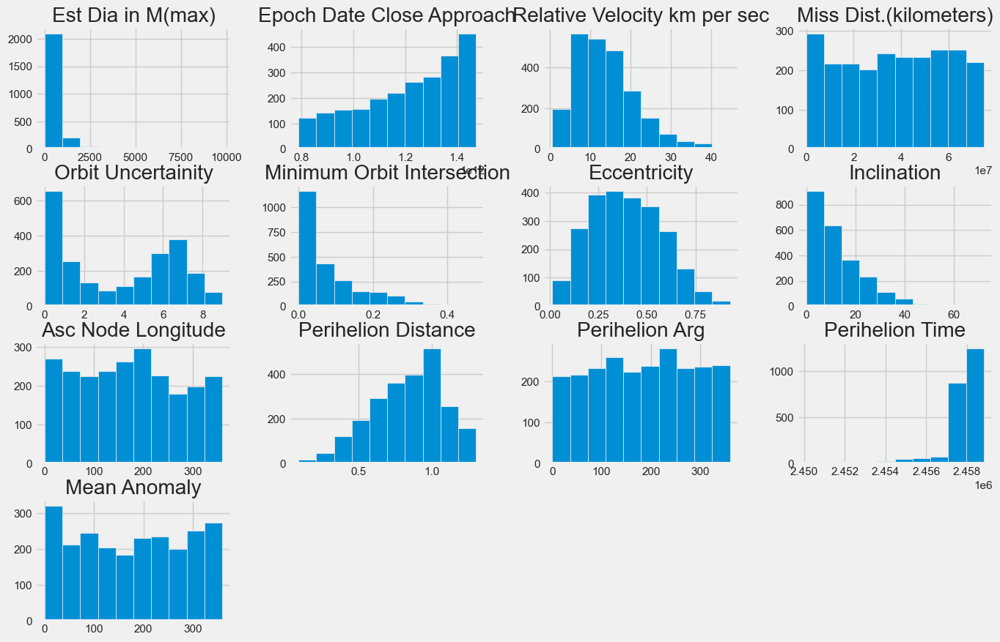

In [50]:
X_train.hist(figsize = (15, 10))

###  Preparing the Data for the Machine Learning Algorithm (Scaling)

In [51]:
# Most machine learning algorithms perform badly with unscaled data
# Since we have many outliers, we choose a Robust Scaler.
# Moreover, we excluded the normalization from our approaches, since compress the data between
# 0 and 1 is a not a great choice in presence of outliers.
from sklearn.preprocessing import RobustScaler

# Instantiate the RobustScaler
scaler = RobustScaler()

# Fit, transform, and (re)convert to a dataframe for the training set
X_train_scaled_array = scaler.fit_transform(X_train)
X_train_scaled_df = pd.DataFrame(X_train_scaled_array, columns = X_train.columns)

# Use the same scaler to transform the validation and test set
X_val_scaled_array = scaler.transform(X_val)
X_val_scaled_df = pd.DataFrame(X_val_scaled_array, columns = X_val.columns)

X_test_scaled_array = scaler.transform(X_test)
X_test_scaled_df = pd.DataFrame(X_test_scaled_array, columns = X_test.columns)

# Note: we only fit the scaler object on the training set and use the same object to transform the validation and test sets.
#      This ensures that we scale the data consistently across all three sets and avoid data leakage from the validation and test sets.

In [52]:
# SCALING THE SECOND DATASET TOO
X_train2_scaled_array = scaler.fit_transform(X_train2)
X_train2_scaled_df = pd.DataFrame(X_train2_scaled_array, columns = X_train2.columns)

# Use the same scaler to transform the validation and test set
X_val2_scaled_array = scaler.transform(X_val2)
X_val2_scaled_df = pd.DataFrame(X_val2_scaled_array, columns = X_val2.columns)

X_test2_scaled_array = scaler.transform(X_test2)
X_test2_scaled_df = pd.DataFrame(X_test2_scaled_array, columns = X_test2.columns)

### Selecting a first simple model: Logistic Regression

In [53]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import cross_validate

# Instantiate and train a Logistic Regression model
logistic = LogisticRegression(random_state = 42)
logistic.fit(X_train_scaled_df, y_train)

# Evaluate the performance of the model using 5-fold cross-validation
cv_res = cross_validate(logistic, X_train_scaled_df, y_train, cv = 5, scoring = ['accuracy', 'precision', 'recall', 'f1'])

# Print results
print("MEAN accuracy score:", np.mean(cv_res['test_accuracy']))
print('MEAN Precision:', np.mean(cv_res['test_precision']))
print('MEAN Recall:', np.mean(cv_res['test_recall']))
print('MEAN F1 score:', np.mean(cv_res['test_f1']))


MEAN accuracy score: 0.9161715698570252
MEAN Precision: 0.7793099547511313
MEAN Recall: 0.6504257682339875
MEAN F1 score: 0.7078832414778525


In [54]:
# TRYING THE SECOND PARAMETERS SELECTION

# Instantiate and train a Logistic Regression model
logistic_2 = LogisticRegression(random_state = 42)
logistic_2.fit(X_train2_scaled_df, y_train)

# Evaluate the performance of the model using 5-fold cross-validation
cv_res_2 = cross_validate(logistic_2, X_train2_scaled_df, y_train, cv = 5, scoring = ['accuracy', 'precision', 'recall', 'f1'])

# Print results
print("MEAN accuracy score:", np.mean(cv_res_2['test_accuracy']))
print('MEAN Precision:', np.mean(cv_res_2['test_precision']))
print('MEAN Recall:', np.mean(cv_res_2['test_recall']))
print('MEAN F1 score:', np.mean(cv_res_2['test_f1']))


# For Logistic Regression performed actually worse

MEAN accuracy score: 0.8742609381158848
MEAN Precision: 0.7127491187862705
MEAN Recall: 0.32524990744168825
MEAN F1 score: 0.44574552562458003


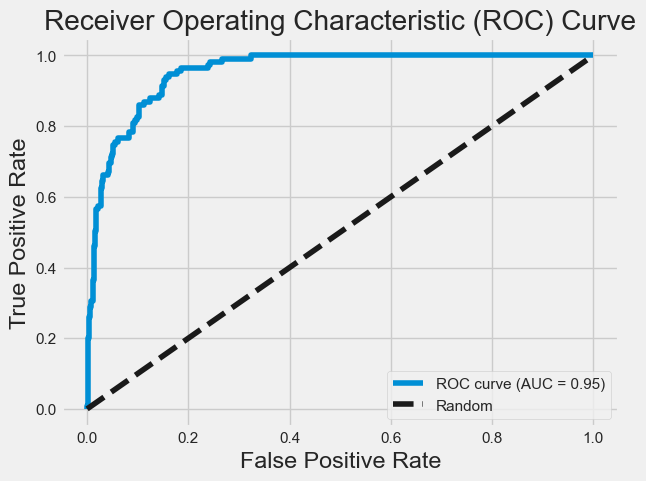

In [55]:
from sklearn.metrics import roc_curve, roc_auc_score

# Predict probabilities of positive class for the test set
y_probs = logistic.predict_proba(X_test_scaled_df)[:, 1]

# Calculate the false positive rate, true positive rate, and thresholds
fpr, tpr, thresholds = roc_curve(y_test, y_probs)

# Calculate the Area Under the ROC Curve (AUC)
auc = roc_auc_score(y_test, y_probs)

# Plot the ROC curve
plt.plot(fpr, tpr, label='ROC curve (AUC = %0.2f)' % auc)
plt.plot([0, 1], [0, 1], 'k--', label='Random')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()


# Reference: ChatGPT

### Selecting a more sophisticated model: Random Forest

In [56]:
# Random Forest is a very powerful model quite robust to outliers and noise
from sklearn.model_selection import cross_validate
from sklearn.ensemble import RandomForestClassifier

# Train a random forest classifier
forest = RandomForestClassifier(random_state = 42)
forest.fit(X_train_scaled_df, y_train)

# Evaluate the performance of the model using 5-fold cross-validation
cv_results = cross_validate(forest, X_train_scaled_df, y_train, cv = 5, scoring = ['accuracy', 'precision', 'recall', 'f1'])

# Print results
print("MEAN accuracy score:", np.mean(cv_results['test_accuracy']))
print('MEAN Precision:', np.mean(cv_results['test_precision']))
print('MEAN Recall:', np.mean(cv_results['test_recall']))
print('MEAN F1 score:', np.mean(cv_results['test_f1']))


MEAN accuracy score: 0.9949215250653959
MEAN Precision: 0.9891521658644947
MEAN Recall: 0.9783783783783783
MEAN F1 score: 0.9836539424716765


In [57]:
# TRYING THE SECOND PARAMETERS SELECTION 

from sklearn.model_selection import cross_validate
from sklearn.ensemble import RandomForestClassifier

# Train a random forest classifier
forest2 = RandomForestClassifier(random_state = 42)
forest2.fit(X_train2, y_train)

# Evaluate the performance of the model using 5-fold cross-validation
cv_results = cross_validate(forest2, X_train2, y_train, cv = 5, scoring = ['accuracy', 'precision', 'recall', 'f1'])

# Print results
print("MEAN accuracy score:", np.mean(cv_results['test_accuracy']))
print('MEAN Precision:', np.mean(cv_results['test_precision']))
print('MEAN Recall:', np.mean(cv_results['test_recall']))
print('MEAN F1 score:', np.mean(cv_results['test_f1']))


# For the Random Forest the second data improved the results

MEAN accuracy score: 0.995345253878955
MEAN Precision: 0.9891861861861863
MEAN Recall: 0.981081081081081
MEAN F1 score: 0.9850328878448502


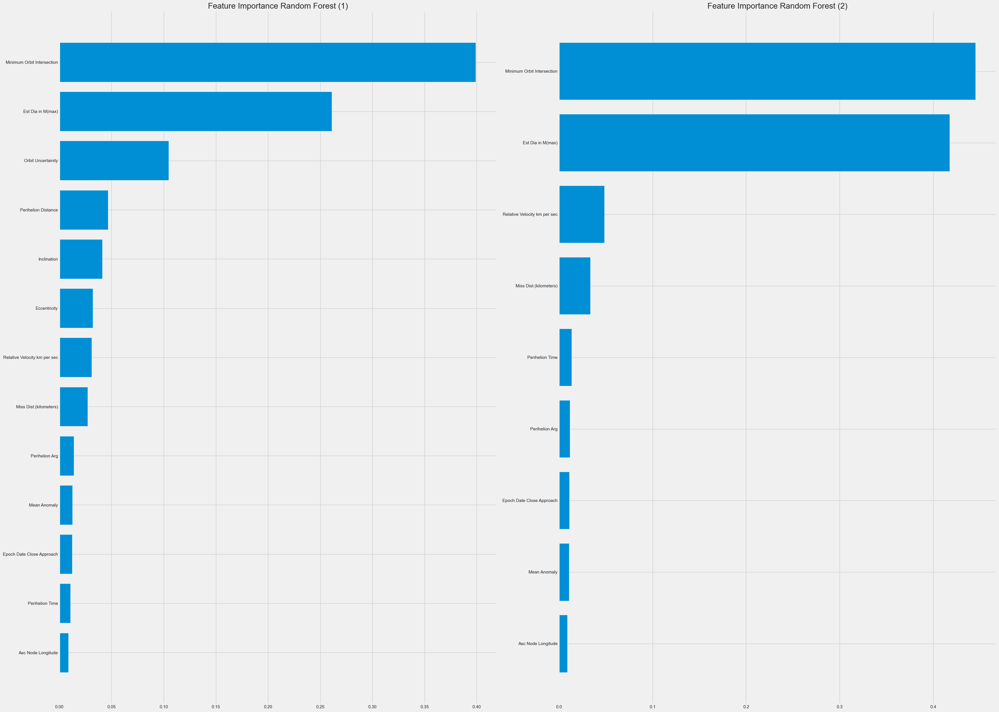

In [58]:
# Checking Feature importance (for both)
fig, axs = plt.subplots(nrows = 1, ncols = 2, figsize=(35,25))

importances1 = forest.feature_importances_
importances2 = forest2.feature_importances_


# Sort feature importances in ascending order
indices1 = np.argsort(importances1)
indices2 = np.argsort(importances2)

axs[0].barh(range(X_train_scaled_df.shape[1]), importances1[indices1])
axs[0].set_title("Feature Importance Random Forest (1)")
axs[0].set_yticks(range(X_train_scaled_df.shape[1]))
axs[0].set_yticklabels(X_train_scaled_df.columns[indices1], rotation=0)

axs[1].barh(range(X_train2_scaled_df.shape[1]), importances2[indices2])
axs[1].set_title("Feature Importance Random Forest (2)")
axs[1].set_yticks(range(X_train2_scaled_df.shape[1]))
axs[1].set_yticklabels(X_train2_scaled_df.columns[indices2], rotation=0)


plt.tight_layout()
plt.show()


In [59]:
# Tunig hyperparameters
from sklearn.model_selection import RandomizedSearchCV

n_estimators = [10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110, 120, 125]
max_depth = [10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110, 120, 125, None]
min_samples_split = [2, 5, 10]
min_samples_leaf = [1, 2, 4]

random_search = RandomizedSearchCV(estimator = RandomForestClassifier(), 
                                   param_distributions = {'n_estimators': n_estimators,
                                                          'max_depth': max_depth,
                                                          'min_samples_split': min_samples_split,
                                                          'min_samples_leaf': min_samples_leaf,
                                                          },
                                   n_iter = 100,
                                   cv = 3,
                                   verbose = 2,
                                   random_state = 42,
                                   n_jobs = -1)


In [60]:
# Fit the random search object to the data:
random_search.fit(X_train_scaled_df, y_train)

Fitting 3 folds for each of 100 candidates, totalling 300 fits


RandomizedSearchCV(cv=3, estimator=RandomForestClassifier(), n_iter=100,
                   n_jobs=-1,
                   param_distributions={'max_depth': [10, 20, 30, 40, 50, 60,
                                                      70, 80, 90, 100, 110, 120,
                                                      125, None],
                                        'min_samples_leaf': [1, 2, 4],
                                        'min_samples_split': [2, 5, 10],
                                        'n_estimators': [10, 20, 30, 40, 50, 60,
                                                         70, 80, 90, 100, 110,
                                                         120, 125]},
                   random_state=42, verbose=2)

In [61]:
# Print the best hyperparameters and their score:
print("Best parameters:", random_search.best_params_)
print("MEAN cross-validated score of the best estimator:", random_search.best_score_)

Best parameters: {'n_estimators': 50, 'min_samples_split': 10, 'min_samples_leaf': 2, 'max_depth': 30}
MEAN cross-validated score of the best estimator: 0.9944965460303536


In [62]:
# Perform a second Random Forest, with the updated parameters
forest2 = RandomForestClassifier(n_estimators = 60, min_samples_split = 10, min_samples_leaf = 2,
                                 max_depth = 10, random_state = 42)

forest2.fit(X_train_scaled_df, y_train)

y_val_pred = forest2.predict(X_val_scaled_df)

In [63]:
# Evaluation (on the validation set)
from sklearn.metrics import precision_recall_fscore_support
from sklearn.metrics import confusion_matrix

precision, recall, f1_score, support = precision_recall_fscore_support(y_val, y_val_pred)

# Metrics
print("Precision:", precision)
print("Recall:", recall)
print("F1 score:", f1_score)
print("Support:", support)

# Checking the confusion matrix
cm = confusion_matrix(y_val, y_val_pred)
print("\n")
print("Confusion matrix: \n", cm)

Precision: [0.996      0.98901099]
Recall: [0.99799599 0.97826087]
F1 score: [0.996997   0.98360656]
Support: [499  92]


Confusion matrix: 
 [[498   1]
 [  2  90]]


In [64]:
# Evaluation on the TEST set
y_pred = forest2.predict(X_test_scaled_df)

precision_2, recall_2, f1_score_2, support_2 = precision_recall_fscore_support(y_test, y_pred)

print("Precision:", precision_2)
print("Recall:", recall_2)
print("F1 score:", f1_score_2)
print("Support:", support_2)

# Checking the confusion matrix
cm_2 = confusion_matrix(y_test, y_pred)
print("\n")
print("Confusion matrix: \n", cm_2)

Precision: [0.9952     0.98245614]
Recall: [0.99679487 0.97391304]
F1 score: [0.9959968  0.97816594]
Support: [624 115]


Confusion matrix: 
 [[622   2]
 [  3 112]]


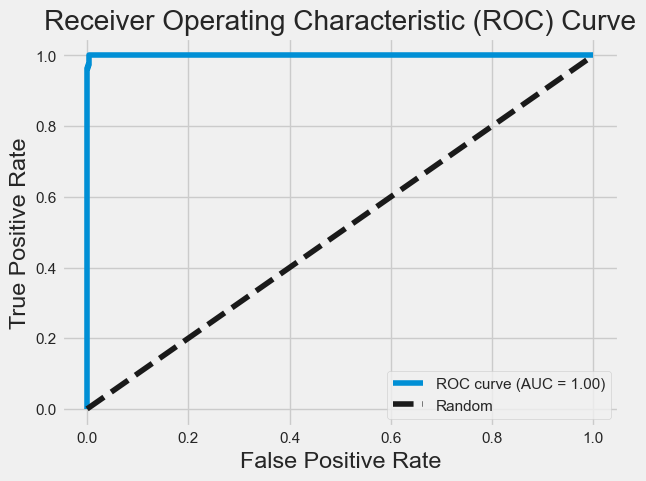

In [65]:
# ROC CURVE

# Predict probabilities of positive class for the test set
y_probs = forest2.predict_proba(X_test_scaled_df)[:, 1]

# Compute the 'true positive rate'  and 'false positive rate'
fpr, tpr, thresholds = roc_curve(y_test, y_probs)

# Calculate the Area Under the ROC Curve (AUC)
auc = roc_auc_score(y_test, y_probs)

# Plot the ROC curve
plt.plot(fpr, tpr, label='ROC curve (AUC = %0.2f)' % auc)
plt.plot([0, 1], [0, 1], 'k--', label='Random')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()

In [66]:
# TESTING THE SECOND PARAMETERS SELECTION

forest2.fit(X_train2_scaled_df, y_train)

# Evaluation on the TEST set
y_pred2 = forest2.predict(X_test2_scaled_df)

precision_3, recall_3, f1_score_3, support_3 = precision_recall_fscore_support(y_test, y_pred2)

print("Precision:", precision_3)
print("Recall:", recall_3)
print("F1 score:", f1_score_3)
print("Support:", support_3)

cm_3 = confusion_matrix(y_test, y_pred2)
print("\n", cm_3)

Precision: [0.99679487 0.9826087 ]
Recall: [0.99679487 0.9826087 ]
F1 score: [0.99679487 0.9826087 ]
Support: [624 115]

 [[622   2]
 [  2 113]]


### Selecting a second model: AdaBoost

In [67]:
from sklearn.ensemble import AdaBoostClassifier
from sklearn.tree import DecisionTreeClassifier

# Instantiate the decision tree classifier as the base estimator
base_estimator = DecisionTreeClassifier(max_depth = 1)

# Instantiate the AdaBoost classifier
ada_boost = AdaBoostClassifier(estimator = base_estimator, random_state = 42)

# Fit the model on the training data
ada_boost.fit(X_train_scaled_df, y_train)

AdaBoostClassifier(estimator=DecisionTreeClassifier(max_depth=1),
                   random_state=42)

In [68]:
# Evaluate the performance of the model using 5-fold cross-validation
cv_results_2 = cross_validate(ada_boost, X_train_scaled_df, y_train, cv = 5, scoring = ['accuracy', 'precision', 'recall', 'f1'])

# Print results
print("MEAN accuracy score:", np.mean(cv_results_2['test_accuracy']))
print('MEAN Precision:', np.mean(cv_results_2['test_precision']))
print('MEAN Recall:', np.mean(cv_results_2['test_recall']))
print('MEAN F1 score:', np.mean(cv_results_2['test_f1']))

MEAN accuracy score: 0.994074963270864
MEAN Precision: 0.9839550284161106
MEAN Recall: 0.9783783783783784
MEAN F1 score: 0.9810035432775475


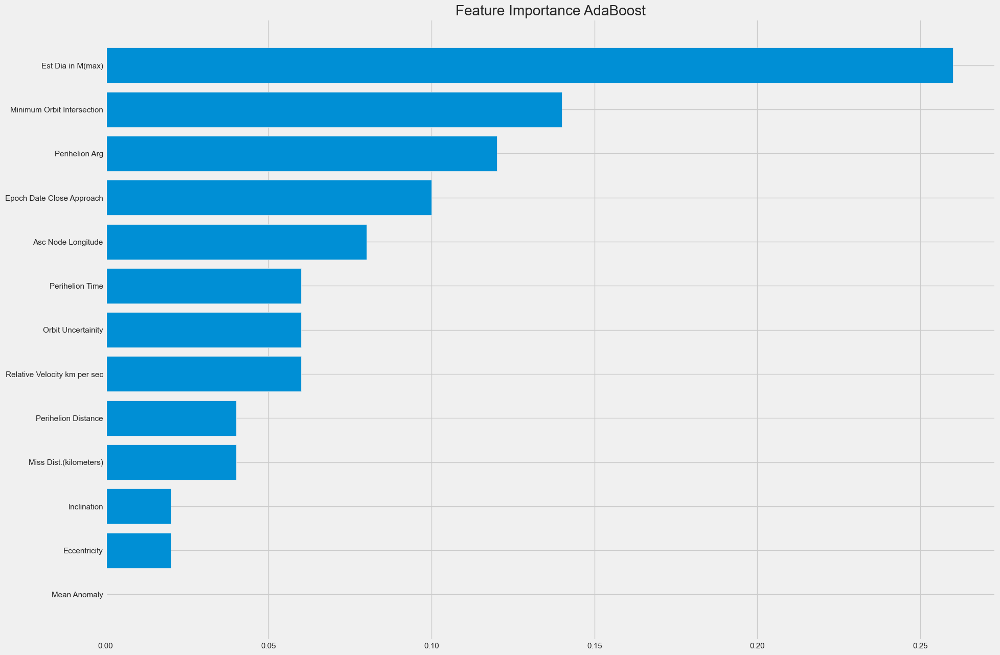

In [69]:
# Checking Feature importance 
plt.figure(figsize = (20,15))

importances_2 = ada_boost.feature_importances_

# Sort feature importances in ascending order
indices_2 = np.argsort(importances_2)

plt.title("Feature Importance AdaBoost")
plt.barh(range(X_train_scaled_df.shape[1]), importances_2[indices_2])
plt.yticks(range(X_train_scaled_df.shape[1]), X_train_scaled_df.columns[indices_2], rotation = 0)
plt.show()

In [70]:
# Tunig hyperparameters
from sklearn.model_selection import RandomizedSearchCV

n_estimators = [30, 40, 50, 60, 70, 80, 90, 100, 110, 120, 130, 140, 150]
learning_rate = [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1]


random_search_2 = RandomizedSearchCV(estimator = AdaBoostClassifier(), 
                                   param_distributions = {'n_estimators': n_estimators,
                                                          'learning_rate': learning_rate,
                                                          },
                                   n_iter = 100, 
                                   cv = 3, 
                                   verbose = 2, 
                                   random_state = 42, 
                                   n_jobs = -1)


In [71]:
# Fit the random search object to the data:
random_search_2.fit(X_train_scaled_df, y_train)

Fitting 3 folds for each of 100 candidates, totalling 300 fits


RandomizedSearchCV(cv=3, estimator=AdaBoostClassifier(), n_iter=100, n_jobs=-1,
                   param_distributions={'learning_rate': [0.1, 0.2, 0.3, 0.4,
                                                          0.5, 0.6, 0.7, 0.8,
                                                          0.9, 1],
                                        'n_estimators': [30, 40, 50, 60, 70, 80,
                                                         90, 100, 110, 120, 130,
                                                         140, 150]},
                   random_state=42, verbose=2)

In [72]:
# Print the best hyperparameters and their score:
print(random_search_2.best_params_)
print(random_search_2.best_score_)    # (Mean cross-validated score of the best_estimator)

{'n_estimators': 70, 'learning_rate': 0.2}
0.994072996686855


In [73]:
# AdaBoost after Randomized Search
ada_boost2 = AdaBoostClassifier(n_estimators = 70, learning_rate = 0.1, random_state = 42)

ada_boost2.fit(X_train_scaled_df, y_train)

y_val_pred_ada = ada_boost2.predict(X_val_scaled_df)

In [74]:
# Evaluation (on the validation set)
from sklearn.metrics import precision_recall_fscore_support

precision_3, recall_3, f1_score_3, support_3 = precision_recall_fscore_support(y_val, y_val_pred_ada)

print("Precision:", precision_3)
print("Recall:", recall_3)
print("F1 score:", f1_score_3)
print("Support:", support_3)

Precision: [0.996      0.98901099]
Recall: [0.99799599 0.97826087]
F1 score: [0.996997   0.98360656]
Support: [499  92]


In [75]:
# Evaluation on the TEST set
y_pred_ada = ada_boost2.predict(X_test_scaled_df)

precision_4, recall_4, f1_score_4, support_4 = precision_recall_fscore_support(y_test, y_pred_ada)

# Metrics
print("Precision:", precision_4)
print("Recall:", recall_4)
print("F1 score:", f1_score_4)
print("Support:", support_4)

# Checking the confusion matrix
cm_3 = confusion_matrix(y_test, y_pred_ada)
print("\n")
print("Confusion matrix: \n", cm_3)

Precision: [0.9952     0.98245614]
Recall: [0.99679487 0.97391304]
F1 score: [0.9959968  0.97816594]
Support: [624 115]


Confusion matrix: 
 [[622   2]
 [  3 112]]


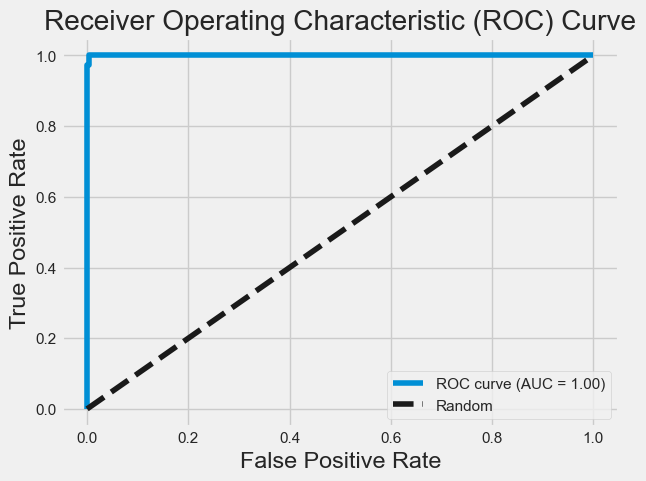

In [76]:
# ROC CURVE

# Predict probabilities of positive class for the test set
y_probs_ada = ada_boost2.predict_proba(X_test_scaled_df)[:, 1]

# Compute the 'true positive rate'  and 'false positive rate'
fpr, tpr, thresholds = roc_curve(y_test, y_probs_ada)

# Calculate the Area Under the ROC Curve (AUC)
auc = roc_auc_score(y_test, y_probs_ada)

# Plot the ROC curve
plt.plot(fpr, tpr, label='ROC curve (AUC = %0.2f)' % auc)
plt.plot([0, 1], [0, 1], 'k--', label='Random')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()

**Note:**
Random Forest is the best model among these two. It also has a better confusion matrix, which is important since we want to maximize recall 

In [77]:
# Evaluation with the OTHER parameter selection
ada_boost3 = AdaBoostClassifier(n_estimators = 70, learning_rate = 0.1, random_state = 42)
ada_boost3.fit(X_train2_scaled_df, y_train)
y_pred_ada3 = ada_boost3.predict(X_test2_scaled_df)

precision_5, recall_5, f1_score_5, support_5 = precision_recall_fscore_support(y_test, y_pred_ada3)

# Metrics
print("Precision:", precision_5)
print("Recall:", recall_5)
print("F1 score:", f1_score_5)
print("Support:", support_5)

# Checking the confusion matrix
cm_4 = confusion_matrix(y_test, y_pred_ada3)
print("\n")
print("Confusion matrix: \n", cm_4)


# Here they improved as well!

Precision: [0.99520767 0.99115044]
Recall: [0.99839744 0.97391304]
F1 score: [0.9968     0.98245614]
Support: [624 115]


Confusion matrix: 
 [[623   1]
 [  3 112]]


### Undersampling

Since our target variable is quite unbalanced, after leaving the data as it is, we tried to perform an oversampling. (verifying in this way the respective results)

In [78]:
# Rechecking distribution
asteroid_df3.Hazardous.value_counts()

0    3116
1     576
Name: Hazardous, dtype: int64

In [79]:
# Selecting the columns we want to use for our analysis
# (the ones we used for the previous models)
columns = list(X_train_scaled_df.columns) + ["Hazardous"]

# Shuffling the data before creating the subsamples
asteroid_df4 = asteroid_df3[columns].sample(frac = 1).copy()

# Compute the undersampling (the amount of hazardous classes are 576)
hazardous = asteroid_df4.loc[asteroid_df4['Hazardous'] == 1]
non_hazardous = asteroid_df4.loc[asteroid_df4['Hazardous'] == 0][:576]

# Merge the information
sum_df = pd.concat([hazardous, non_hazardous])

# Shuffle dataframe rows
undersampled_asteroid = sum_df.sample(frac = 1, random_state = 42)

# Visualize the new dataframe
undersampled_asteroid.head()

,Est Dia in M(max),Epoch Date Close Approach,Relative Velocity km per sec,Miss Dist.(kilometers),Orbit Uncertainity,Minimum Orbit Intersection,Eccentricity,Inclination,Asc Node Longitude,Perihelion Distance,Perihelion Arg,Perihelion Time,Mean Anomaly,Hazardous
3588,682.401509,1463900400000,15.653161,48732944.0,0,0.007339,0.489405,27.852378,218.502751,0.800630,66.284773,2.458290e+06,214.774261,1
427,284.472297,934095600000,1.666421,49189784.0,0,0.287750,0.376900,3.784007,192.602757,1.294425,136.428843,2.457985e+06,5.127483,0
2048,225.964377,1282460400000,8.628721,15653106.0,0,0.052092,0.543404,6.010986,25.921361,0.954644,297.000699,2.457634e+06,119.447638,0
3280,986.370281,1434351600000,18.823735,51074908.0,0,0.015861,0.776469,11.784926,317.258607,0.305287,59.218459,2.457821e+06,110.820299,1
2163,43.056624,1299571200000,11.061742,50774900.0,7,0.017042,0.206479,20.161264,180.926850,0.969234,225.269204,2.457953e+06,34.841629,0


Distribution of the Classes in the subsample dataset
1    0.5
0    0.5
Name: Hazardous, dtype: float64


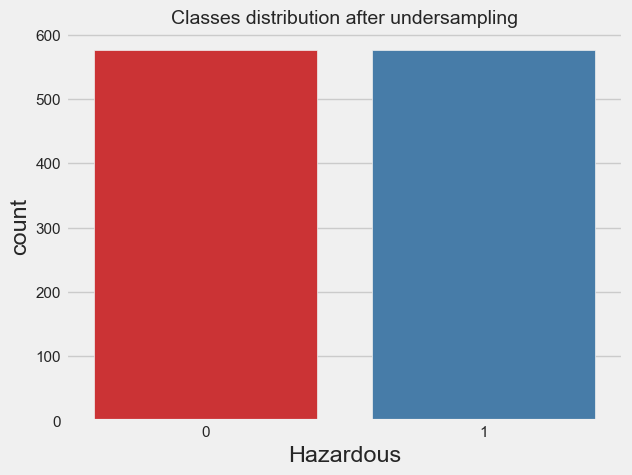

In [80]:
# Re-check the class distribution
print('Distribution of the Classes in the subsample dataset')
print(undersampled_asteroid['Hazardous'].value_counts() / len(undersampled_asteroid))

sns.countplot(x = 'Hazardous', data = undersampled_asteroid, palette = 'Set1')
plt.title('Classes distribution after undersampling', fontsize = 14)
plt.show()

In [81]:
# Train_test_split 2
X_sub = undersampled_asteroid.drop(columns = "Hazardous")
y_sub = undersampled_asteroid["Hazardous"]

print(X_sub.shape)
print(y_sub.shape)

(1152, 13)
(1152,)


In [82]:
# For new my goal is to predict fraudolent transactions 
X_train_sub, X_test_sub, y_train_sub, y_test_sub = train_test_split(X_sub, y_sub, random_state = 42)

print(X_train_sub.shape)
print(X_test_sub.shape)
print(y_train_sub.shape)
print(y_test_sub.shape)

(864, 13)
(288, 13)
(864,)
(288,)


In [83]:
# SCALING

# Instantiate the RobustScaler
scaler = RobustScaler()

# Fit, transform, and (re)convert to a dataframe for the training set
X_train_sub_scaled_array = scaler.fit_transform(X_train_sub)
X_train_sub_scaled_df = pd.DataFrame(X_train_sub_scaled_array, columns = X_train_sub.columns)

X_test_sub_scaled_array = scaler.transform(X_test_sub)
X_test_sub_scaled_df = pd.DataFrame(X_test_sub_scaled_array, columns = X_test_sub.columns)

In [84]:
# Performing a Random Forest classifier using the parameters where considered optimal
# by the Randomized Search
forest_sub = RandomForestClassifier(n_estimators = 60, min_samples_split = 10, min_samples_leaf = 2,
                                    max_depth = 10, random_state = 42)

forest_sub.fit(X_train_sub_scaled_df, y_train_sub)
y_pred_sub = forest_sub.predict(X_test_sub_scaled_df)

In [85]:
# Print metrics
precision_sub, recall_sub, f1_score_sub, support_sub = precision_recall_fscore_support(y_test_sub, y_pred_sub)

print("Precision:", precision_sub)
print("Recall:", recall_sub)
print("F1 score:", f1_score_sub)
print("Support:", support_sub)

Precision: [0.9921875 0.9875   ]
Recall: [0.98449612 0.99371069]
F1 score: [0.98832685 0.99059561]
Support: [129 159]


In [86]:
# Print confusion matrix
cm_sub = confusion_matrix(y_test_sub, y_pred_sub)
print(cm_sub)

[[127   2]
 [  1 158]]


In [87]:
# Evaluating on the bigger test set: (Random Forest_2)
y_pred_final = forest_sub.predict(X_test_scaled_df)


precision_sub2, recall_sub2, f1_score_sub2, support_sub2 = precision_recall_fscore_support(y_test, y_pred_final)#, zero_division=1)

# Metrics per class [first class second class]
print("Precision:", precision_sub2)
print("Recall:", recall_sub2)
print("F1 score:", f1_score_sub2)
print("Support:", support_sub2)

cm_sub2 = confusion_matrix(y_test, y_pred_final)
print("\n", cm_sub2)

Precision: [1.        0.5399061]
Recall: [0.84294872 1.        ]
F1 score: [0.91478261 0.70121951]
Support: [624 115]

 [[526  98]
 [  0 115]]


We basically improved a lot the recall (minimizing the false negative), but we increased the false positive as well. Depending on the situation and on the request, we will be able to select one or the other